# Do size, location, and age of houses affect the assessed value of houses in Miami?

#### By: Rehan Mondal

## 1. Introduction ##

Living in Miami, the so-called 'Magic City', located in Florida, is for many people a dream. However, the housing market is very competitive. From last year the prices skyrocketed by 24.6 % from a median house price of \\$425,300  in September 2021, to \\$530,000 in September 2022 (Redfin, 2022). Moreover, Archer et al. (1996) found that Miami housing prices are associated most strongly with neighbourhood, ethnic mix, and housing unit breakdown of the area. Therefore, in our statistical analysis we want to examine the driving factors and provide insights about the housing prices in the city by answering the inferential question of **Do size, location, and age of houses affect the assessed value of houses in Miami?** Therefore, in order to answer this we will use the Miami Housing Dataset from Kaggle, which contains information on 13,932 single-family houses sold in Miami by using our response variable as sale price (in \\$) and various explanatory variables, such as land area, floor area, value of special features, distance to the nearest locations such as railway line, ocean, water body, central business district, subcenter, and highway, age of the house, acceptable level of airplane noise, and the qualtiy of the house. We will do that by focusing on inferential methods and techniques such as stepwise forward selection, t-test, and F-test.

## 2. Preliminary Results ##

In [14]:
# load packages
#install.packages('reshape2')
library(dplyr)
library(leaps)
library(tidyverse)
library(broom)
library(reshape2)

In [15]:
# saves link of data from web source
url <- "https://raw.githubusercontent.com/abhinavkansal08/STAT-301/main/miami-housing.csv"
# loads the data  
house_data <- read.csv(url)
head(house_data)

,LATITUDE,LONGITUDE,PARCELNO,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>
1,25.89103,-80.16056,622280070620,440000,9375,1753,0,2815.9,12811.4,347.6,42815.3,37742.2,15954.9,67,0,8,4
2,25.89132,-80.15397,622280100460,349000,9375,1715,0,4359.1,10648.4,337.8,43504.9,37340.5,18125.0,63,0,9,4
3,25.89133,-80.15374,622280100470,800000,9375,2276,49206,4412.9,10574.1,297.1,43530.4,37328.7,18200.5,61,0,2,4
4,25.89176,-80.15266,622280100530,988000,12450,2058,10033,4585.0,10156.5,0.0,43797.5,37423.2,18514.4,63,0,9,4
5,25.89182,-80.15464,622280100200,755000,12800,1684,16681,4063.4,10836.8,326.6,43599.7,37550.8,17903.4,42,0,7,4
6,25.89206,-80.16135,622280070180,630000,9900,1531,2978,2391.4,13017.0,188.9,43135.1,38176.2,15687.2,41,0,2,4


In [16]:
# cleaning and wrangling the data into tidy format, and selecting our response and explanatory variables
house_data_filtered <- house_data %>%
subset(select = -c(LATITUDE,LONGITUDE,PARCELNO,month_sold))

head(house_data_filtered)

,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,structure_quality
,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
1,440000,9375,1753,0,2815.9,12811.4,347.6,42815.3,37742.2,15954.9,67,0,4
2,349000,9375,1715,0,4359.1,10648.4,337.8,43504.9,37340.5,18125.0,63,0,4
3,800000,9375,2276,49206,4412.9,10574.1,297.1,43530.4,37328.7,18200.5,61,0,4
4,988000,12450,2058,10033,4585.0,10156.5,0.0,43797.5,37423.2,18514.4,63,0,4
5,755000,12800,1684,16681,4063.4,10836.8,326.6,43599.7,37550.8,17903.4,42,0,4
6,630000,9900,1531,2978,2391.4,13017.0,188.9,43135.1,38176.2,15687.2,41,0,4


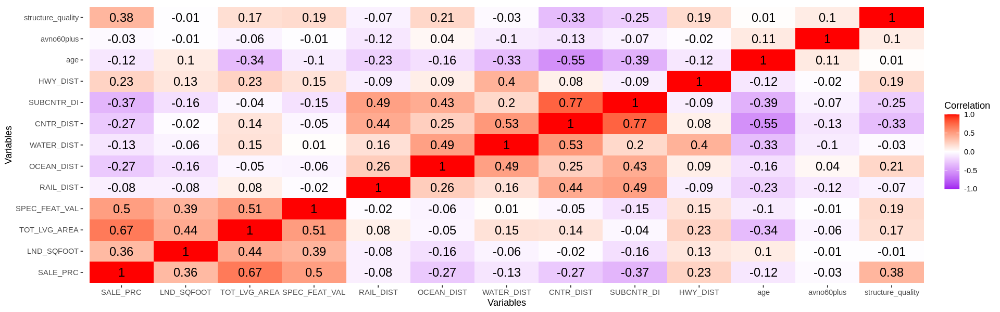

In [17]:
# created heatmap to summarize and better visualize the response and explanatory variables 
options(repr.plot.width = 16, repr.plot.height = 5)
corr_df <- round(cor(house_data_filtered), 2)
corr_matrix <- melt(corr_df)
ggplot(data = corr_matrix, aes(x = Var1, y = Var2, fill = value)) + 
  geom_tile() +
  geom_text(aes(Var2, Var1, label = value), size = 5) +
  labs(x = "Variables", y = "Variables")+
  scale_fill_gradient2(low = "purple", high = "red",
                       limit = c(-1,1), name = "Correlation") +
  theme(panel.background = element_blank())

> We can see that there are some high correlations between the SALE_PRC and the independent variables, such as TOT_LVG_AREA and SPEC_FEAT_VAL. Moreover, we should be careful with the correlation between the covariates, since they could cause Multicollinearity. Multicollinearity increases the variance of the estimator. This phenomenon inflates the standard error, which reduces the power of the test to detect a significant non-zero slope

## 3. Split the Data

Since the same data can not be used to select and to make inference, we need 2 different datasets: a selection set and a training set. Using the same data to select and estimate violates the assumptions of the analysis and invalidate results. This problem is known as a post-inference problem

In [5]:
# set the seed
set.seed(123) 

# split the house data into training and testing where 70% of the observations from house data is training set
house_data_filtered$ID <- rownames(house_data_filtered)
training_housing <- sample_n(house_data_filtered, size = nrow(house_data_filtered) * 0.7, replace = FALSE)

# create test housing where 30% of the observations from the house data is testing set by ID
second_set_housing <- anti_join(house_data_filtered, training_housing, by = "ID")

training_housing <- select(training_housing, -ID)
second_set_housing <- select(second_set_housing, -ID)

## 4. Selecting a generative model

We will select the model based on backward selecion algorithm, and evaluate the model based on the adjusted R-sqaured, which is the most important metric for inference. We will use the model that is suggested by these algorithm, train the model on the training data and infer Information about our model.

#### Forward selection

As we have many potential input variables are available in the dataset, not all may be relevant to explain the variation of the response variable. The *subset* algorithms can be used to select a subset of variable to build generative models. 

In this part, we will use the *forward* selection algorithm and the *adjusted* $R^2$ to select a smaller model. The forward selection method ensures some optimality of the small feature subsets, which works best for our data set. The selection will be done using the `second_set_data` dataset and the model will be fitted on the `training_housing` data.

In [6]:
# carried out forward selection by using regsubsets function
housing_forward_sel <- regsubsets(
   x= SALE_PRC ~ ., 
   nvmax=12,
   data=second_set_housing,
   method="forward",
 )
 housing_forward_sel

# printed out the summary of the forward selection model
housing_fwd_summary <- summary(housing_forward_sel)

housing_fwd_summary_df <- data.frame(
    n_input_variables = 1:12,
    RSQ = housing_fwd_summary$rsq,
    RSS = housing_fwd_summary$rss,
    ADJ.R2 = housing_fwd_summary$adjr2)

Subset selection object
Call: regsubsets.formula(x = SALE_PRC ~ ., nvmax = 12, data = second_set_housing, 
    method = "forward", )
12 Variables  (and intercept)
                  Forced in Forced out
LND_SQFOOT            FALSE      FALSE
TOT_LVG_AREA          FALSE      FALSE
SPEC_FEAT_VAL         FALSE      FALSE
RAIL_DIST             FALSE      FALSE
OCEAN_DIST            FALSE      FALSE
WATER_DIST            FALSE      FALSE
CNTR_DIST             FALSE      FALSE
SUBCNTR_DI            FALSE      FALSE
HWY_DIST              FALSE      FALSE
age                   FALSE      FALSE
avno60plus            FALSE      FALSE
structure_quality     FALSE      FALSE
1 subsets of each size up to 12
Selection Algorithm: forward

> The forward subset algorithm selected the best model of each size (max input variables = 12)

In [7]:
housing_fwd_summary

Subset selection object
Call: regsubsets.formula(x = SALE_PRC ~ ., nvmax = 12, data = second_set_housing, 
    method = "forward", )
12 Variables  (and intercept)
                  Forced in Forced out
LND_SQFOOT            FALSE      FALSE
TOT_LVG_AREA          FALSE      FALSE
SPEC_FEAT_VAL         FALSE      FALSE
RAIL_DIST             FALSE      FALSE
OCEAN_DIST            FALSE      FALSE
WATER_DIST            FALSE      FALSE
CNTR_DIST             FALSE      FALSE
SUBCNTR_DI            FALSE      FALSE
HWY_DIST              FALSE      FALSE
age                   FALSE      FALSE
avno60plus            FALSE      FALSE
structure_quality     FALSE      FALSE
1 subsets of each size up to 12
Selection Algorithm: forward
          LND_SQFOOT TOT_LVG_AREA SPEC_FEAT_VAL RAIL_DIST OCEAN_DIST WATER_DIST
1  ( 1 )  " "        "*"          " "           " "       " "        " "       
2  ( 1 )  " "        "*"          " "           " "       " "        " "       
3  ( 1 )  " "        "*"     

In [8]:
housing_fwd_summary_df

n_input_variables,RSQ,RSS,ADJ.R2
<int>,<dbl>,<dbl>,<dbl>
1,0.4305710,2.495907e+14,0.4304347
2,0.5634650,1.913409e+14,0.5632560
3,0.5916298,1.789958e+14,0.5913364
4,0.6414821,1.571446e+14,0.6411386
5,0.6536581,1.518077e+14,0.6532432
6,0.6613953,1.484163e+14,0.6609084
7,0.6675509,1.457182e+14,0.6669931
8,0.6756266,1.421785e+14,0.6750044
9,0.6788397,1.407702e+14,0.6781465


In [9]:
housing_fwd_summary$which[11,]

(Intercept)        LND_SQFOOT      TOT_LVG_AREA     SPEC_FEAT_VAL 
             TRUE              TRUE              TRUE              TRUE 
        RAIL_DIST        OCEAN_DIST        WATER_DIST         CNTR_DIST 
             TRUE              TRUE             FALSE              TRUE 
       SUBCNTR_DI          HWY_DIST               age        avno60plus 
             TRUE              TRUE              TRUE              TRUE 
structure_quality 
             TRUE

> - Since we want to do inference we look at the adjusted R-squared, which suggests that we should take the model with 11 input parameters. Moreover, we can see that forward, as well as backward selection are selecting the same model. Now, that we selected a model, we can train the model and provide inferential statements.

> - The forward subset algorithm selected the best model to have 11 variables. This gives the greatest *adjusted* $R^2$ and after this, increasing any variables causes the  *adjusted* $R^2$ to decrease. Below we view which varibales are present in the best model.

## 5. Inference

In [10]:
# after selecting the model we are training it using lm() function
housing_fwd_generative <- lm(SALE_PRC ~ LND_SQFOOT + TOT_LVG_AREA + SPEC_FEAT_VAL + RAIL_DIST + OCEAN_DIST + CNTR_DIST + SUBCNTR_DI + HWY_DIST + age + avno60plus + structure_quality,
   data = training_housing
 )

tidy(housing_fwd_generative)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),7.087246e+04,1.226636e+04,5.7777906,7.801082e-09
LND_SQFOOT,2.704103e+00,3.492325e-01,7.7429868,1.067782e-14
TOT_LVG_AREA,1.946691e+02,2.998673e+00,64.9184088,0.000000e+00
SPEC_FEAT_VAL,2.978169e+00,1.525618e-01,19.5210671,2.802913e-83
RAIL_DIST,4.242414e+00,3.391998e-01,12.5071218,1.280714e-35
OCEAN_DIST,-4.445756e+00,1.223431e-01,-36.3384206,2.961761e-271
CNTR_DIST,-3.136651e+00,1.062838e-01,-29.5120329,2.027006e-183
SUBCNTR_DI,1.052142e-01,1.461480e-01,0.7199159,4.715941e-01
HWY_DIST,4.611893e+00,3.205958e-01,14.3853823,1.909536e-46


### R-squared

In [11]:
# we are computing the R-squared value after generating the model
summary(housing_fwd_generative)$r.squared

[1] 0.6895252

The estimated model explains circa 68.95 % of the variation in the response. The goodness of the model can't really be commented at face value only relative to another model, but around 69% is reasonably high. 

### T-tests (alpha = 0.05)

- We are taking 0.05 or 5% significance level because it is the most optimal significance level to test our hypothesis and compare our p-value.

- Since the p-value is below 0.05, we have enough evidence to reject the null hypothesis, that there is no association between the Sale Price and the following: TOT_LVG_AREA, CNTR_DIST, OCEAN_DIST, structure_quality, SPEC_FEAT_VAL, age, RAIL_DIST, HWY_DIST, LND_SQFOOT, avno60plus.

- Since the p-value is above 0.05, we fail to reject the null hypothesis, that there is no association between the Sale Price and the SUBCNTR_DI.

### Coefficients

We will only interpret those coefficients which are significant, since we don't have enough evidence to reject the hypothesis, that they are 0, which would mean that they are not important to explain the response.

- TOT_LVG_AREA: An increase in total living area by 1, is associated with an expected increase in the sale price by 194.67 Dollars (holding all other variables constant).
- CNTR_DIST: An increase in the distance to the center by 1, is associated with an expected decrease in the sale price by 3.14 Dollars (holding all other variables constant).
- OCEAN_DIST: An increase in the distance to the ocean by 1, is associated with an expected decrease in the sale price by 4.45 Dollars (holding all other variables constant).
- structure_quality: An increase in the structure quality by 1, is associated with an expected increase in the sale price by 61234.09 Dollars (holding all other variables constant).
- SPEC_FEAT_VAL: An increase in the value of special features (e.g. swimming pool) by 1, is associated with an expected increase in the sale price by 2.98 Dollars (holding all other variables constant).
- age: An increase in the age by 1, is associated with an expected decrease in the sale price by 1906.79 Dollars (holding all other variables constant).
- RAIL_DIST: An increase in the railway distance by 1, is associated with an expected increase in the sale price by 4.24 Dollars (holding all other variables constant).
- HWY_DIST: An increase in the highway distance by 1, is associated with an expected increase in the sale price by 4.61 Dollars (holding all other variables constant).
- LND_SQFOOT: An increase in the squarefoot of the land by 1, is associated with an expected increase in the sale price by 2.70 Dollars (holding all other variables constant).
- avno60plus: When the airplane noise is exceeding an acceptable level, it is associated with an expected decrease in the sale price by 67119 Dollars (for any level of the other variables).

Heads up: we are doing many tests here, so we need to be careful with the significances, because about 5% of the time it will be a false discovery. To avoid that problem we can use an F-test to compare the overall significance of the model.

### F-test

In [12]:
# returning all the summary statistics for our generated model
glance(housing_fwd_generative)

r.squared,adj.r.squared,sigma,statistic,p.value,df,logLik,AIC,BIC,deviance,df.residual,nobs
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
0.6895252,0.6891746,175245.1,1966.482,0,11,-131576.6,263179.1,263272.5,2.991238e+14,9740,9752


Since the p-value is 0 we have enough evidence to reject the hypothesis, that there is no association between the response and the independent variables.

## 6. Model Assumptions

In order to make sure our model, and thus the inferential statements are valid we have to chek the LINE assumptions with residual plots.

#### L: Linear relationship between x and y

Residuals vs. Fitted can be used to check the Linearity assumption. Residuals should be patternless around Y = 0; if not there is a pattern in the data that is currently unaccounted for
<!--  -->
#### I: Independence of errors

To check the independence of errors, we will use the same plot of the residuals against the fitted values and look for patterns in the data.


Note: only because our errors are uncorrelated it doesn't mean that they are independent, but without knowledge about the data collection/study design we can't assess that assumption thoroughly.

#### N: The responsens are normally distributed at each level of x

We will use the Normal Q-Q to check the Normality assumption. It plots the theoretical Quantiles of a normal distributions against the standardized residuals. Thus, deviations from a straight line suggests that the Normality assumption is shaky.

#### E: The variance of the responses is equally for all levels of x

A scale-location plot, that plots the fitted values against the squareroot of the standardized residuals, can be used to check the equal variance. Positive or negative trends across the fitted values indicate variability that is not constant.

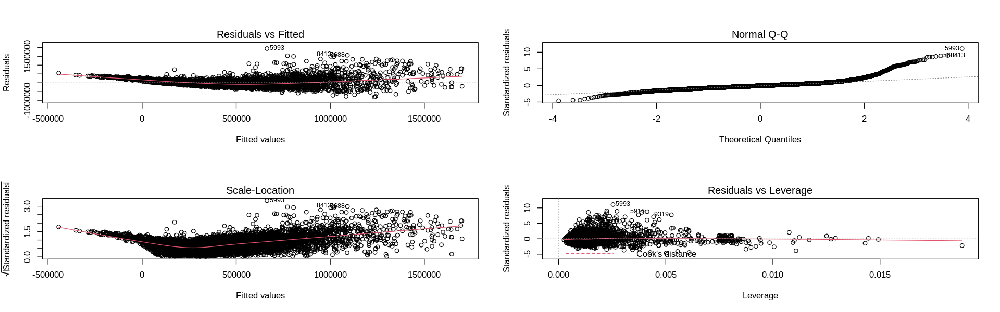

In [13]:
# visulaizing different plots for our generated model
par(mfrow = c(2, 2))
plot(housing_fwd_generative)

- L: we can clearly see a pattern in the residuals, the tend to be lower for mediocre fitted values and start to increase afterwards. This suggests that there is something that we didn't account for.
- I: Again, it is hard to assess the independence of the errors but since there is corrleation between them, it seems that they are not independent.
- N: we can see some deviations for lower and especially for higher theoretical quantiles, which means that the normality assumption is shaky.
- E: Looking at the lower left plot, we can see that there is a positive pattern, in the data. Thus, we might have to decline the equal variance asssumption

## 7. Conclusion

#### Summarize what you found, and the implications/impact of your findings:
 
We found a model that provided a relatively good fit, with 11 covariates in total (of 12 that could have been chosen). Water_Dist doesn’t seem to be of much importance, since the association to the sale price is not significant. This strengthens our original hypothesis of the importance of all variables in relation to house value, because only one variable was not statistically significant in our generative model. Regarding our research question, we can provide the driving factors of housing prices in miami with decreasing importance (as selected by the forward regression algorithm):
  - TOT_LVG_AREA
  - CNTR_DIST
  - OCEAN_DIST
  - structure_quality
  - SPEC_FEAT_VAL
  - age
  - RAIL_DIST
  - HWY_DIST
  - LND_SQFOOT
  - avno60plus
  - SUBCNTR_DI
- As explained in the introduction, our model could assist real estate agents in house evaluation, increasing the revenue and the objectivity of the acquisition process. Moreover, it could be helpful for people that are interested in buying a house, but don't know how to fairly assess the value of a house. This would decrease information asymmetries.

#### If relevant, discuss whether your results were what you expected to find:

- On the one hand the results match our expectations, since 11 of the 12 inputs that we selected were important, and 10 of these were significant in the end.
- On the other hand, in the Proposal we explained that we want to achieve a flawless model, but as we have seen in the assumptions check, the model doesn't really meet the LINE assumptions. Furthermore, we were expecting that the reduced model would contain fewer variables than what it actually produced. In addition to that we were expecting Water_Dist to be a variable that would affect the house prices significantly, as in places like Vancouver, there is a price premium on houses that are close to the ocean. In the real world most people tend to prefer houses near the water/beach and usually the properties near beaches have much higher prices.

#### Discuss how your model could be improved:

- The model could be further improved if we could collect more information about the neighbourhoods and or other facilities / features of the house. In that case if those factors have a bigger effect on the price of the house then the model may give better results.
- We could account for the findings in the assumptions check. For instance, we could try different polynomial degrees of the explanatory variables to improve the fit of the model and decrease the flaws.
- We could use a more advanced model, e.g. we could use the Lasso regression to select the variables and fit a post-inference model to provide inferential statements.
- We could scale our data and detect outliers to increase the performance of our model.

#### Discuss future questions/research this study could lead to:

- The further research question that can be extended from our research is how does the price of the houses are affected by the state of the economy and how does the housing market fluctuate over time? 
- Additionaly, future research could focus on the improvements of our model, as explained above, to increase the accuracy of our model.

## 8. References ##

Archer, Wayne R., et al. “Measuring the Importance of Location in House Price Appreciation.” Journal of Urban Economics, vol. 40, no. 3, 1996, pp. 334–353., doi:10.1006/juec.1996.0036. 

Contractor, Deep. “Miami Housing Dataset.” Kaggle, 30 Jan. 2022, www.kaggle.com/datasets/deepcontractor/miami-housing-dataset. 

Redfin. “Miami Housing Market: House Prices & Trends | Redfin.” Redfin, 2022, www.redfin.com/city/11458/FL/Miami/housing-market. 